In [63]:
import numpy as np
from scipy.stats import spearmanr
from sklearn.metrics.pairwise import cosine_similarity
import pickle as pkl
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from tqdm import tqdm
import os

In [ ]:
embeddings_50 = pkl.load(open('../embeddings/embeddings_50.pkl', 'rb'))
embeddings_200 = pkl.load(open('../embeddings/embeddings_200.pkl', 'rb'))

word2index = pkl.load(open('../word2index.pkl', 'rb'))

with open ('../word_similarity/combined.tab') as f:
    wordsim = [line.strip().split() for line in f]

with open ('../word_similarity/SimLex-999/SimLex-999.txt') as f:
    simlex = [line.strip().split() for line in f]

In [4]:
wordsim = wordsim[1:]
simlex = simlex[1:]
wordsim = [(word1, word2, similarity) for word1, word2, similarity in wordsim]
simlex = [(word1, word2, similarity) for word1, word2, _, similarity, _, _, _, _, _, _ in simlex]

In [ ]:
with open ('../word_similarity/MEN/MEN_dataset_lemma_form_full') as f:
    men = [line.strip().split() for line in f]

men = [[line[0][:-2], line[1][:-2], line[2]] for line in men]

In [ ]:
def normalize_embeddings(embeddings, epsilon=1e-9):
    norms = np.linalg.norm(embeddings, axis=1, keepdims=True)
    norms = np.where(norms == 0, epsilon, norms)
    normalized_embeddings = embeddings / norms
    return normalized_embeddings

embeddings_50_normalized = normalize_embeddings(embeddings_50)
embeddings_200_normalized = normalize_embeddings(embeddings_200)

In [ ]:
pkl.dump(embeddings_50_normalized, open('../embeddings/embeddings_50_normalized.pkl', 'wb'))
pkl.dump(embeddings_200_normalized, open('../embeddings/embeddings_200_normalized.pkl', 'wb'))

### Word Similarity 

In [ ]:
def evaluate_similarity(embeddings, word_to_index, similarity_data):
    predicted_similarities = []
    human_similarities = []

    for word1, word2, human_similarity in similarity_data:
        if word1 in word_to_index and word2 in word_to_index:
            index1 = word_to_index[word1]
            index2 = word_to_index[word2]
            embedding1 = embeddings[index1].reshape(1, -1)
            embedding2 = embeddings[index2].reshape(1, -1)
            cosine_sim = cosine_similarity(embedding1, embedding2)[0, 0]
            predicted_similarities.append(cosine_sim)
            human_similarities.append(float(human_similarity))

    correlation, _ = spearmanr(predicted_similarities, human_similarities)
    return correlation



In [37]:
correlation_simlex_50 = evaluate_similarity(embeddings_50, word2index, simlex)
correlation_wordsim_50 = evaluate_similarity(embeddings_50, word2index, wordsim)
correlation_men_50 = evaluate_similarity(embeddings_50, word2index, men)
correlation_simlex_200 = evaluate_similarity(embeddings_200, word2index, simlex)
correlation_wordsim_200 = evaluate_similarity(embeddings_200, word2index, wordsim)
correlation_men_200 = evaluate_similarity(embeddings_200, word2index, men)

print(f"SimLex-999 Correlation (d=50): {correlation_simlex_50}")
print(f"WordSim-353 Correlation (d=50): {correlation_wordsim_50}")
print(f"MEN Correlation (d=50): {correlation_men_50}")
print(f"SimLex-999 Correlation (d=200): {correlation_simlex_200}")
print(f"WordSim-353 Correlation (d=200): {correlation_wordsim_200}")
print(f"MEN Correlation (d=200): {correlation_men_200}")

SimLex-999 Correlation (d=50): 0.13435414591654685
WordSim-353 Correlation (d=50): 0.3675329707457413
MEN Correlation (d=50): 0.3737405239832508
SimLex-999 Correlation (d=200): 0.13746947193003928
WordSim-353 Correlation (d=200): 0.3709517215555686
MEN Correlation (d=200): 0.4128866869755527


In [38]:
correlation_simlex_50_normalized = evaluate_similarity(embeddings_50_normalized, word2index, simlex)
correlation_wordsim_50_normalized = evaluate_similarity(embeddings_50_normalized, word2index, wordsim)
correlation_men_50_normalized = evaluate_similarity(embeddings_50_normalized, word2index, men)
correlation_simlex_200_normalized = evaluate_similarity(embeddings_200_normalized, word2index, simlex)
correlation_wordsim_200_normalized = evaluate_similarity(embeddings_200_normalized, word2index, wordsim)
correlation_men_200_normalized = evaluate_similarity(embeddings_200_normalized, word2index, men)

print(f"SimLex-999 Correlation (d=50, normalized): {correlation_simlex_50_normalized}")
print(f"WordSim-353 Correlation (d=50, normalized): {correlation_wordsim_50_normalized}")
print("MEN Correlation (d=50, normalized):", correlation_men_50_normalized)
print(f"SimLex-999 Correlation (d=200, normalized): {correlation_simlex_200_normalized}")
print(f"WordSim-353 Correlation (d=200, normalized): {correlation_wordsim_200_normalized}")
print(f"MEN Correlation (d=200, normalized): {correlation_men_200_normalized}")

SimLex-999 Correlation (d=50, normalized): 0.13435414591654685
WordSim-353 Correlation (d=50, normalized): 0.3675329707457413
MEN Correlation (d=50, normalized): 0.3737405239832508
SimLex-999 Correlation (d=200, normalized): 0.13746947193003928
WordSim-353 Correlation (d=200, normalized): 0.3709517215555686
MEN Correlation (d=200, normalized): 0.4128866869755527


### Analogy

In [ ]:
bats = '../analogy/BATS_3.0'

pairs = {}

for relation in os.listdir(bats):
    for category in os.listdir(os.path.join(bats, relation)):
        if category == 'metadata.json':
            continue
        with open(os.path.join(bats, relation, category)) as f:
            for line in f:
                line = line.strip().split()
                line[0] = line[0].split('/')[0]
                line[1] = line[1].split('/')[0]
                if category[:3] not in pairs:
                    pairs[category[:3]] = []
                pairs[category[:3]].append(line)

In [59]:
def evaluate_analogy(words, word2index, embedding, correctness):
    correct = 0
    total = 0
    cosine = 0
    for pair in words:
        if pair[0] in word2index and pair[1] in word2index and pair[2] in word2index and pair[3] in word2index:
            total += 1
            index1 = word2index[pair[0]]
            index2 = word2index[pair[1]]
            index3 = word2index[pair[2]]
            index4 = word2index[pair[3]]
            embedding1 = embedding[index1].reshape(1, -1)
            embedding2 = embedding[index2].reshape(1, -1)
            embedding3 = embedding[index3].reshape(1, -1)
            embedding4 = embedding[index4].reshape(1, -1)
            difference = embedding2 - embedding1 + embedding3
            similarity = cosine_similarity(difference, embedding4)[0, 0]
            cosine += similarity
            if similarity > correctness:
                correct += 1
    return correct / total, cosine / total, total

In [60]:
words = []

for category in pairs.keys():
    for i in range(0, len(pairs[category]), 2):
        words.append(pairs[category][i] + pairs[category][i + 1])


In [ ]:
correctness, cosine, total = evaluate_analogy(words, word2index, embeddings_50, 0.5)
print(f"Analogy correctness (d=50): {correctness}")
print(f"Analogy cosine similarity (d=50): {cosine}")
print(f"Analogy total (d=50): {total}")
print()
correctness, cosine, total = evaluate_analogy(words, word2index, embeddings_200, 0.5)
print(f"Analogy correctness (d=200): {correctness}")
print(f"Analogy cosine similarity (d=200): {cosine}")
print(f"Analogy total (d=200): {total}")
print()
correctness, cosine, total = evaluate_analogy(words, word2index, embeddings_50_normalized, 0.5)
print(f"Analogy correctness (d=50, normalized): {correctness}")
print(f"Analogy cosine similarity (d=50, normalized): {cosine}")
print(f"Analogy total (d=50, normalized): {total}")
print()
correctness, cosine, total = evaluate_analogy(words, word2index, embeddings_200_normalized, 0.5)
print(f"Analogy correctness (d=200, normalized): {correctness}")
print(f"Analogy cosine similarity (d=200, normalized): {cosine}")
print(f"Analogy total (d=200, normalized): {total}")
print()

Analogy correctness (d=50): 0.5644736842105263
Analogy cosine similarity (d=50): 0.4151810676316677
Analogy total (d=50): 760

Analogy correctness (d=200): 0.45263157894736844
Analogy cosine similarity (d=200): 0.3573357970628343
Analogy total (d=200): 760

Analogy correctness (d=50, normalized): 0.6263157894736842
Analogy cosine similarity (d=50, normalized): 0.5456578376163118
Analogy total (d=50, normalized): 760

Analogy correctness (d=200, normalized): 0.3881578947368421
Analogy cosine similarity (d=200, normalized): 0.4136385518200444
Analogy total (d=200, normalized): 760



### Visualisation

In [21]:
def cluster_embeddings(embeddings, num_clusters=10):
    kmeans = KMeans(n_clusters=num_clusters, random_state=42, max_iter=100)
    clusters = kmeans.fit_predict(embeddings)
    return clusters, kmeans.labels_

def reduce_embeddings(embeddings, method='tsne'):
    if method == 'tsne':
        reducer = TSNE(n_components=2, random_state=42, n_iter=700)
    elif method == 'pca':
        reducer = PCA(n_components=2, random_state=42)
    reduced_embeddings = reducer.fit_transform(embeddings)
    return reduced_embeddings


  0%|          | 0/9 [00:00<?, ?it/s]C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
 11%|█         | 1/9 [05:46<46:09, 346.19s/it]C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
 22%|██▏       | 2/9 [11:29<40:11, 344.50s/it]C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-pa

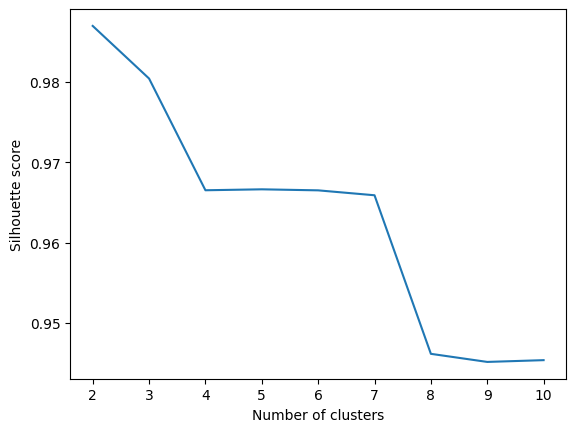

In [ ]:
silhouette_scores_50 = []
clusters_array_50 = []
labels_array_50 = []
for num_clusters in tqdm(range(2, 11)):
    clusters, labels = cluster_embeddings(embeddings_50, num_clusters)
    clusters_array_50.append(clusters)
    labels_array_50.append(labels)
    silhouette_scores_50.append(silhouette_score(embeddings_50, labels))

plt.plot(range(2, 11), silhouette_scores_50)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.show()


  0%|          | 0/9 [00:00<?, ?it/s]C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
 11%|█         | 1/9 [07:05<56:46, 425.78s/it]C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
 22%|██▏       | 2/9 [14:13<49:47, 426.82s/it]C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-pa

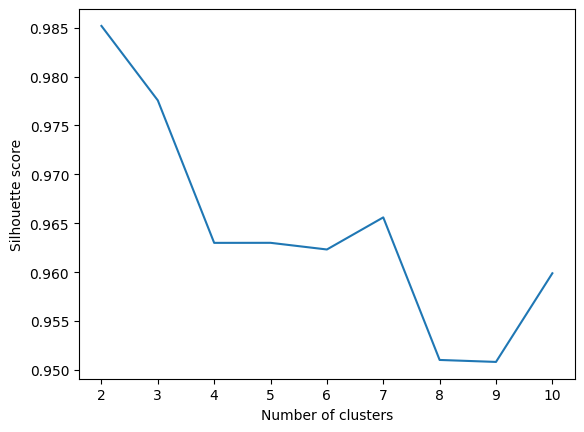

In [49]:
silhouette_scores_200 = [] 
clusters_array_200 = []
labels_array_200 = []
for num_clusters in tqdm(range(2, 11)):
    clusters, labels = cluster_embeddings(embeddings_200, num_clusters)
    clusters_array_200.append(clusters)
    labels_array_200.append(labels)
    silhouette_scores_200.append(silhouette_score(embeddings_200, labels))

plt.plot(range(2, 11), silhouette_scores_200)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.show()

In [ ]:
pkl.dump(clusters_array_50, open('../kmeans/clusters_array_50.pkl', 'wb'))
pkl.dump(labels_array_50, open('../kmeans/labels_array_50.pkl', 'wb'))
pkl.dump(clusters_array_200, open('../kmeans/clusters_array_200.pkl', 'wb'))
pkl.dump(labels_array_200, open('../kmeans/labels_array_200.pkl', 'wb'))

  0%|          | 0/9 [00:00<?, ?it/s]C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
 11%|█         | 1/9 [05:36<44:49, 336.16s/it]C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
 22%|██▏       | 2/9 [11:07<38:53, 333.35s/it]C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-pa

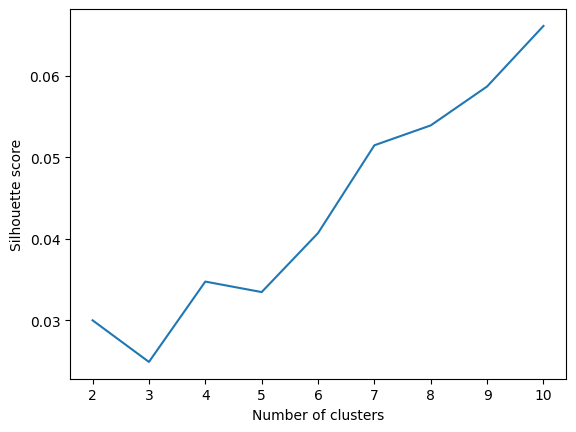

In [19]:
silhouette_scores_50 = []
clusters_array_50 = []
labels_array_50 = []
for num_clusters in tqdm(range(2, 11)):
    clusters, labels = cluster_embeddings(embeddings_50_normalized, num_clusters)
    clusters_array_50.append(clusters)
    labels_array_50.append(labels)
    silhouette_scores_50.append(silhouette_score(embeddings_50_normalized, labels))

plt.plot(range(2, 11), silhouette_scores_50)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.show()

  0%|          | 0/9 [00:00<?, ?it/s]C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
 11%|█         | 1/9 [06:40<53:20, 400.09s/it]C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
 22%|██▏       | 2/9 [13:27<47:09, 404.26s/it]C:\Users\Dell\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-pa

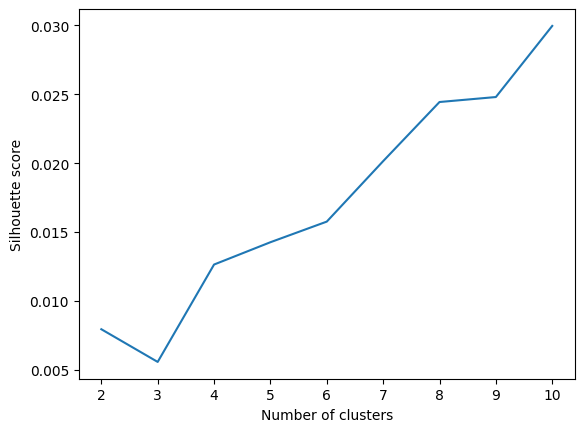

In [20]:
silhouette_scores_200 = [] 
clusters_array_200 = []
labels_array_200 = []
for num_clusters in tqdm(range(2, 11)):
    clusters, labels = cluster_embeddings(embeddings_200_normalized, num_clusters)
    clusters_array_200.append(clusters)
    labels_array_200.append(labels)
    silhouette_scores_200.append(silhouette_score(embeddings_200_normalized, labels))

plt.plot(range(2, 11), silhouette_scores_200)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.show()

In [ ]:
pkl.dump(clusters_array_50, open('../kmeans/clusters_array_50_normalized.pkl', 'wb'))
pkl.dump(labels_array_50, open('../kmeans/labels_array_50_normalized.pkl', 'wb'))
pkl.dump(clusters_array_200, open('../kmeans/clusters_array_200_normalized.pkl', 'wb'))
pkl.dump(labels_array_200, open('../kmeans/labels_array_200_normalized.pkl', 'wb'))

In [ ]:
clusters_array_50 = pkl.load(open('../kmeans/clusters_array_50.pkl', 'rb'))
labels_array_50 = pkl.load(open('../kmeans/labels_array_50.pkl', 'rb'))
clusters_array_200 = pkl.load(open('../kmeans/clusters_array_200.pkl', 'rb'))
labels_array_200 = pkl.load(open('../kmeans/labels_array_200.pkl', 'rb'))

In [23]:
pca_embeddings_50 = reduce_embeddings(embeddings_50, method='pca')
pca_embeddings_200 = reduce_embeddings(embeddings_200, method='pca')


In [26]:
pca_embeddings_50_normalized = reduce_embeddings(embeddings_50_normalized, method='pca')
pca_embeddings_200_normalized = reduce_embeddings(embeddings_200_normalized, method='pca')

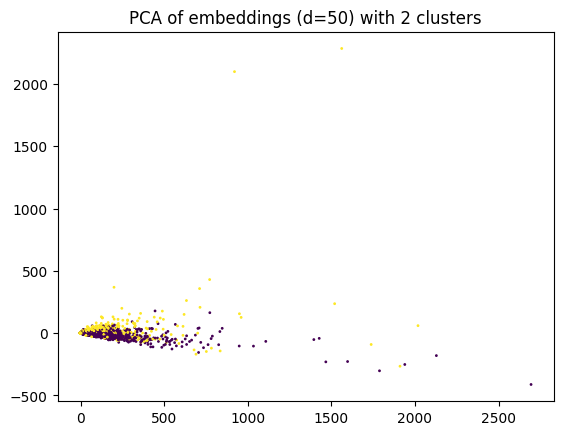

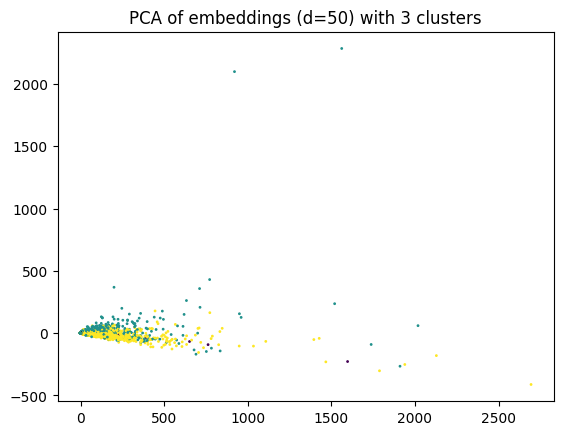

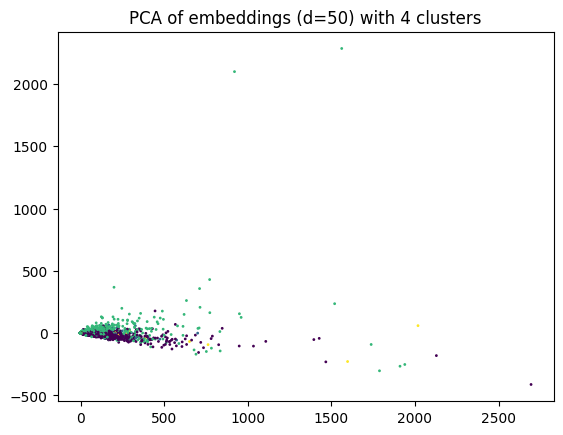

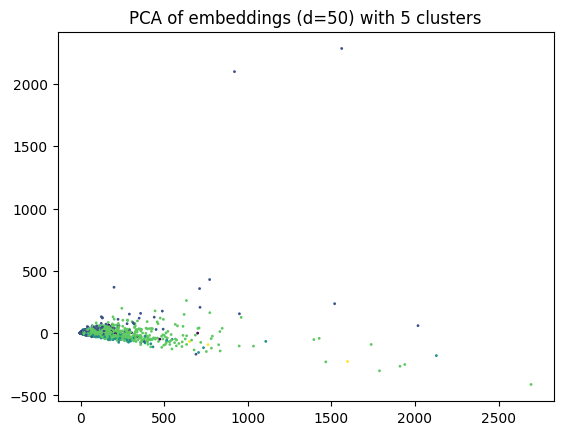

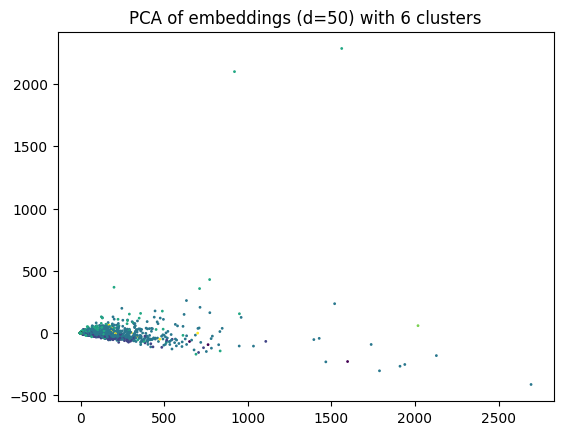

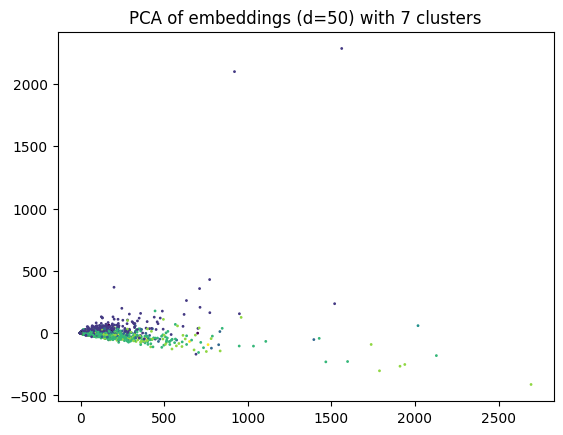

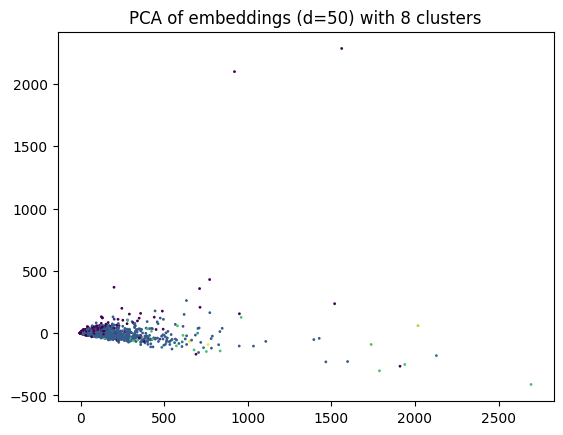

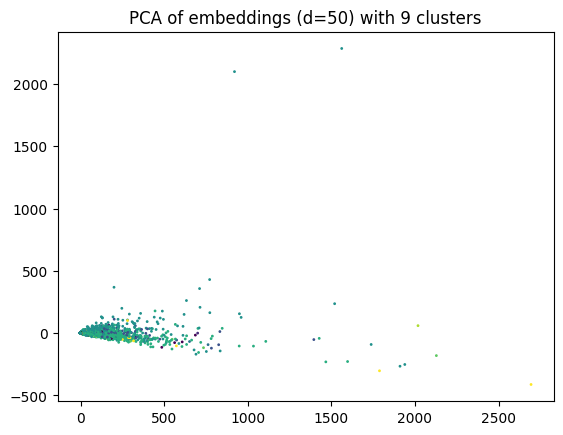

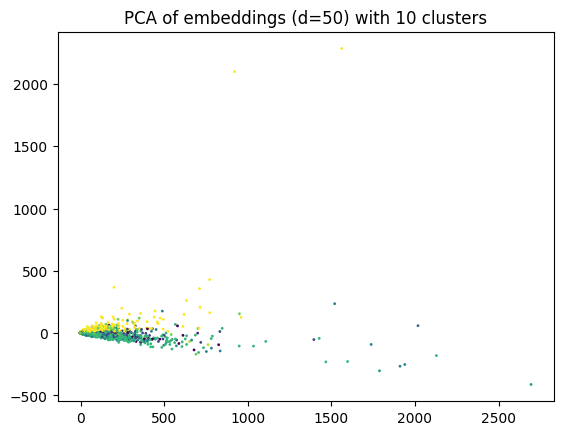

In [24]:
# plot the clusters with all cluster numbers
for i in range(9):
    plt.scatter(pca_embeddings_50[:, 0], pca_embeddings_50[:, 1], c=clusters_array_50[i], s=1)
    plt.title(f'PCA of embeddings (d=50) with {i+2} clusters')
    plt.show()

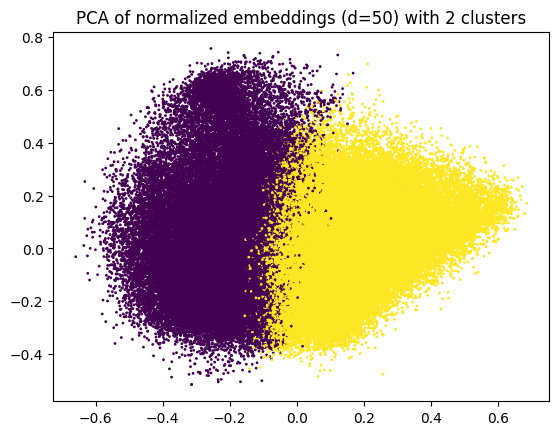

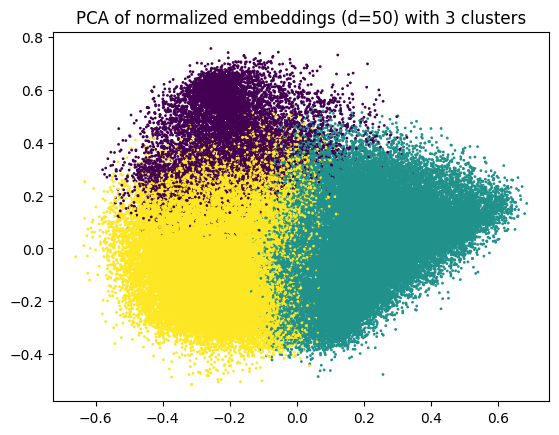

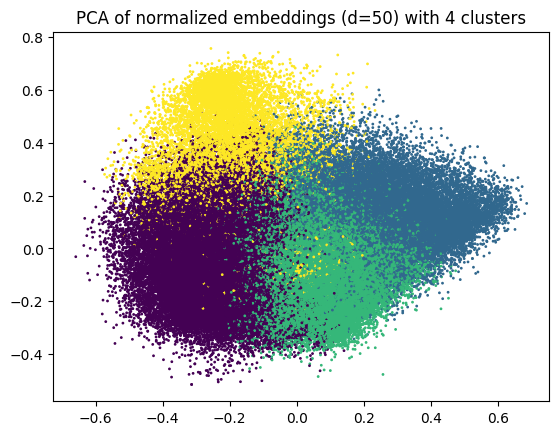

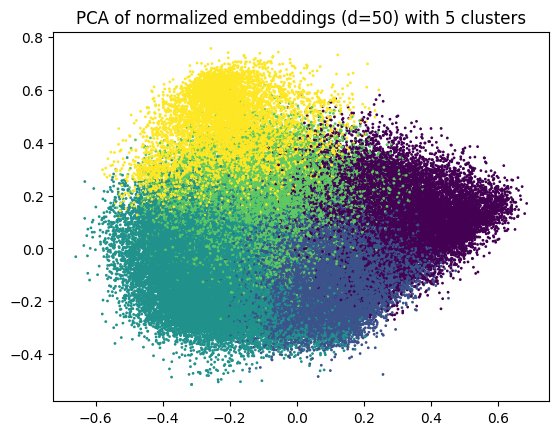

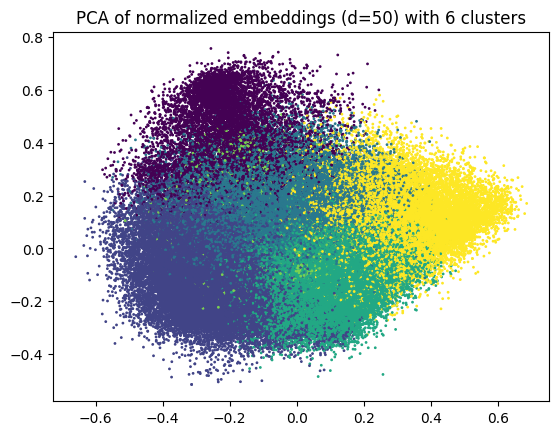

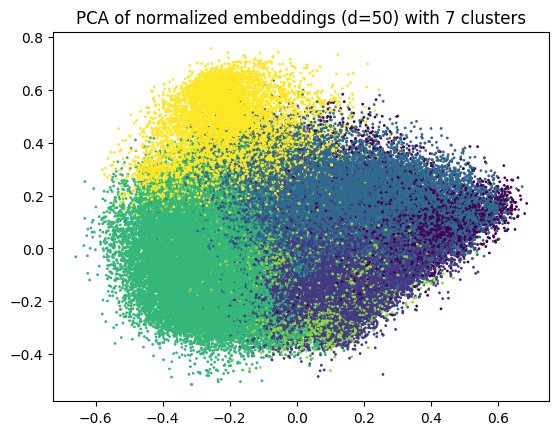

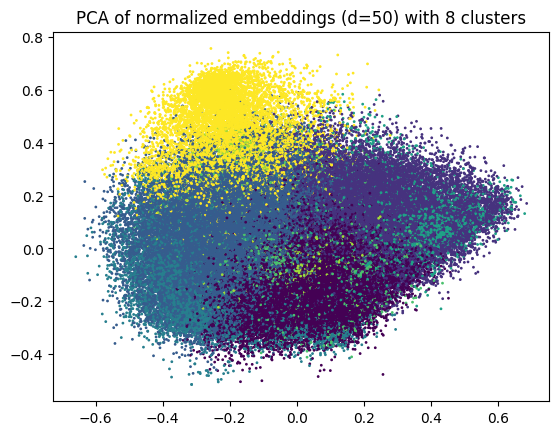

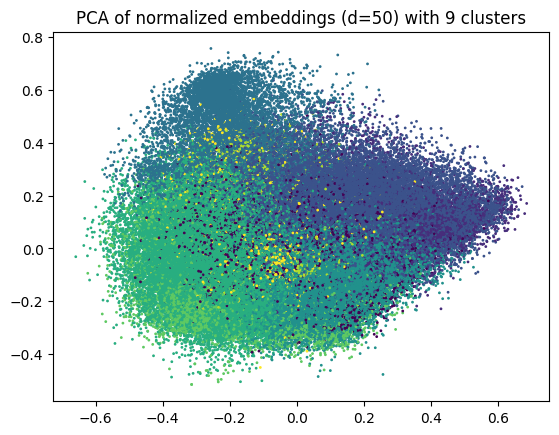

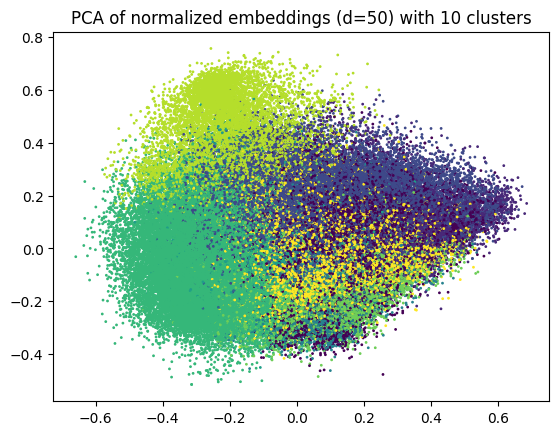

In [ ]:
for i in range(9):
    plt.scatter(pca_embeddings_50_normalized[:, 0], pca_embeddings_50_normalized[:, 1], c=clusters_array_50[i], s=1)
    plt.title(f'PCA of normalized embeddings (d=50) with {i+2} clusters')
    plt.show()

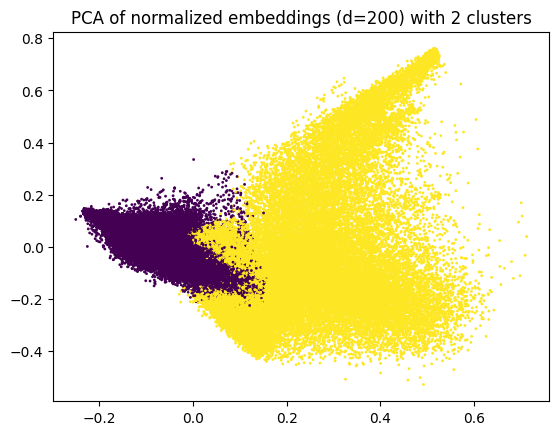

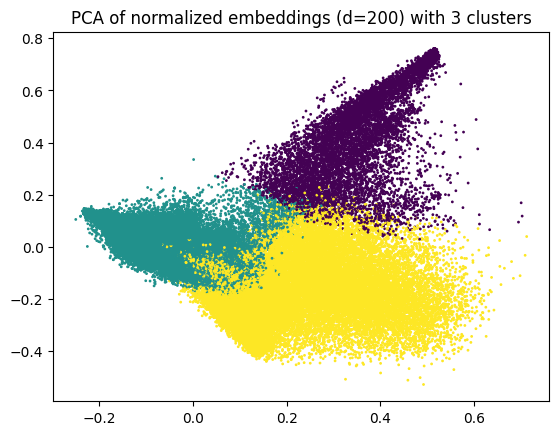

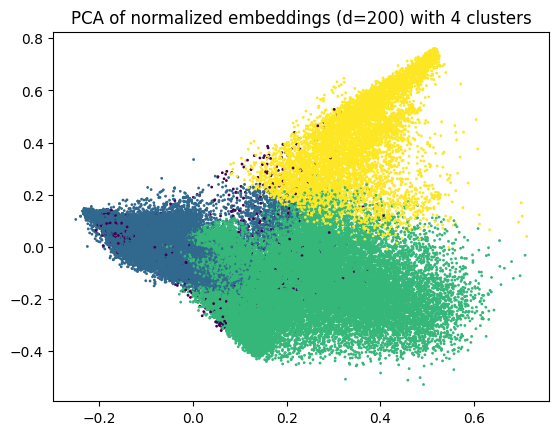

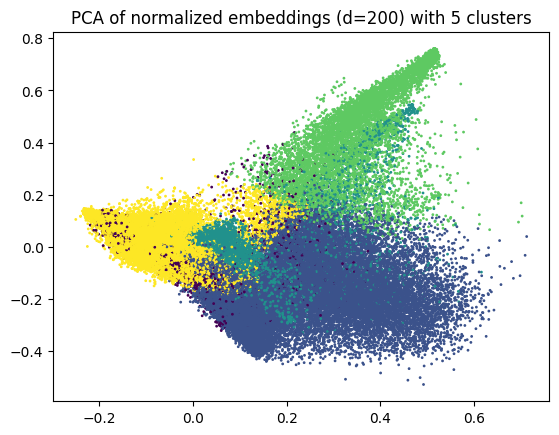

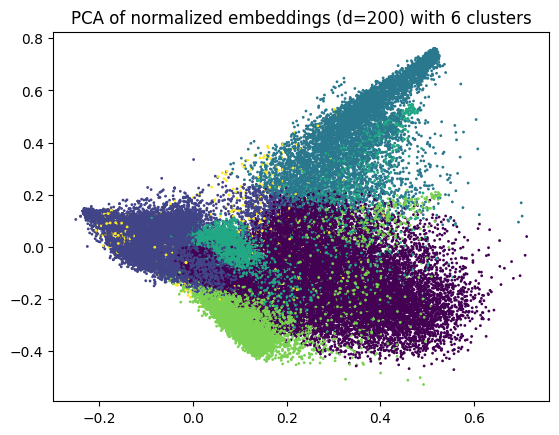

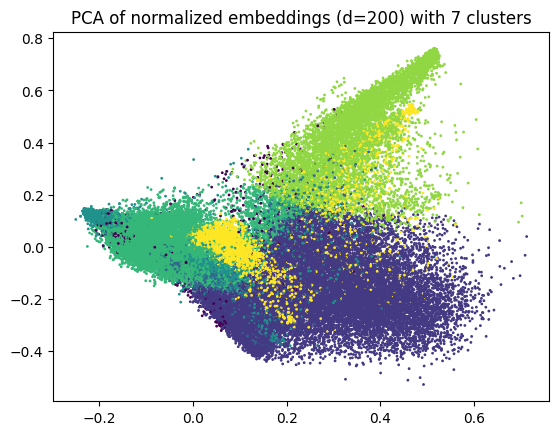

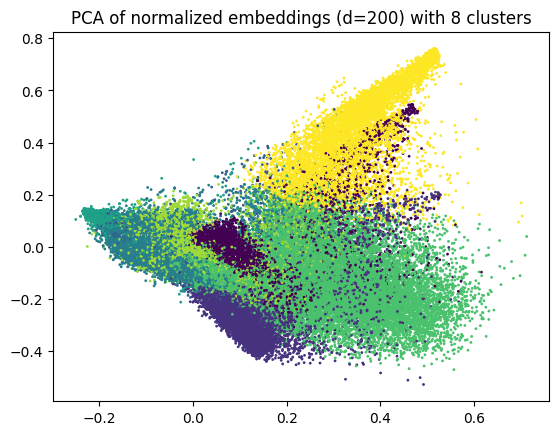

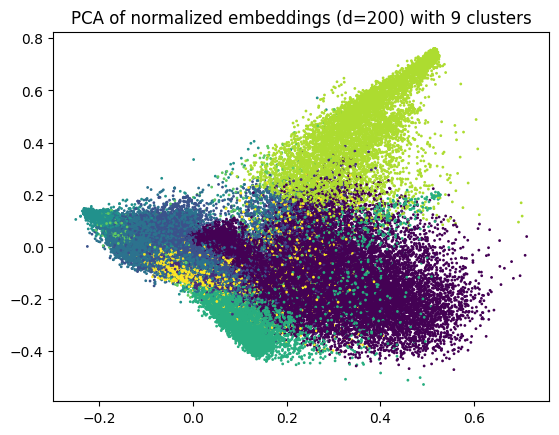

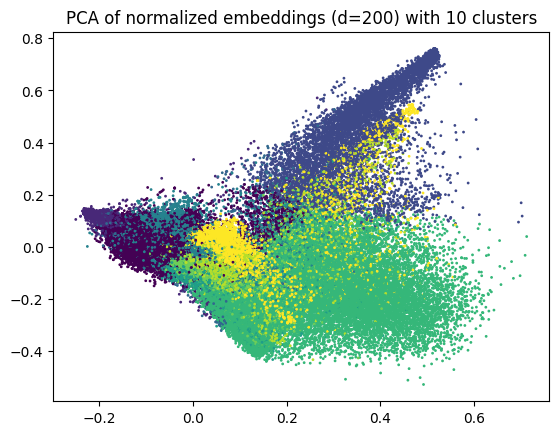

In [ ]:
for i in range(9):
    plt.scatter(pca_embeddings_200_normalized[:, 0], pca_embeddings_200_normalized[:, 1], c=clusters_array_200[i], s=1)
    plt.title(f'PCA of normalized embeddings (d=200) with {i+2} clusters')
    plt.show()

In [29]:
tsne_embeddings_50 = reduce_embeddings(embeddings_50_normalized, method='tsne')
tsne_embeddings_200 = reduce_embeddings(embeddings_200_normalized, method='tsne')

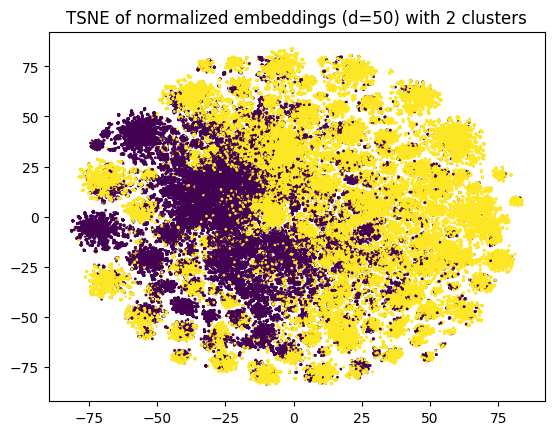

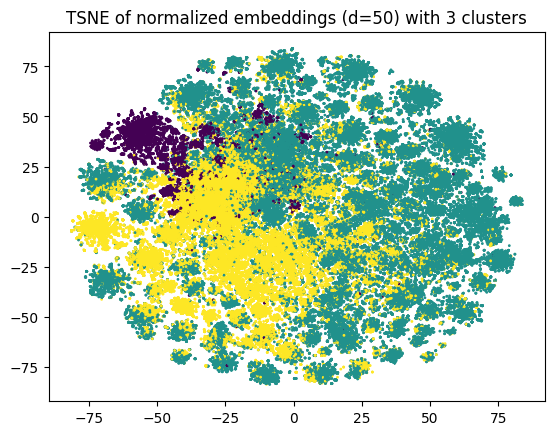

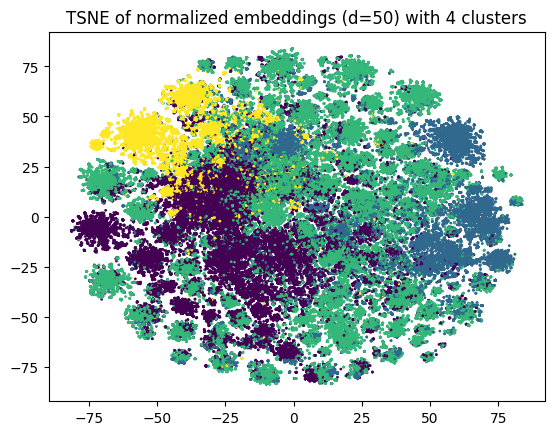

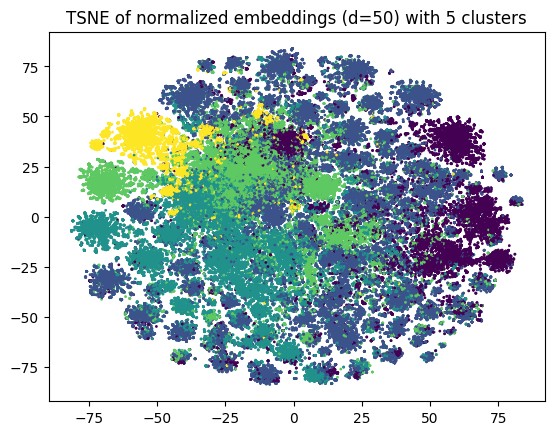

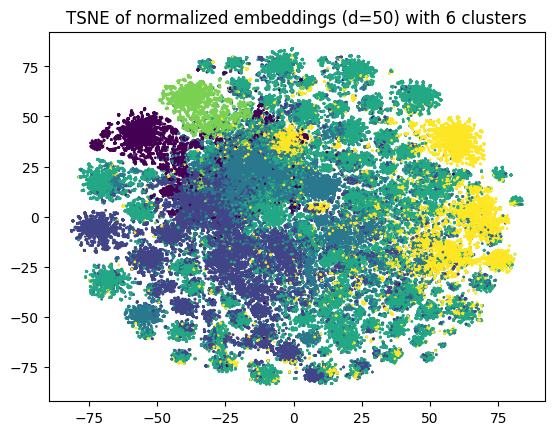

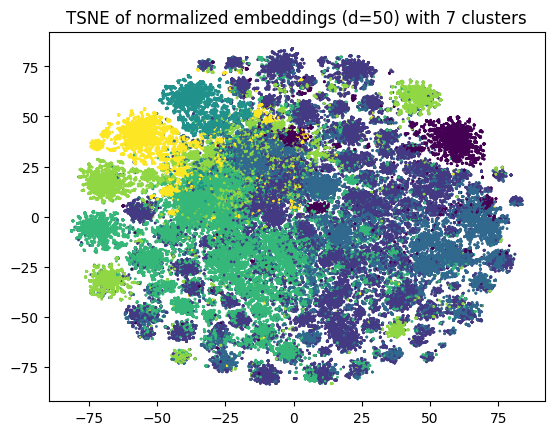

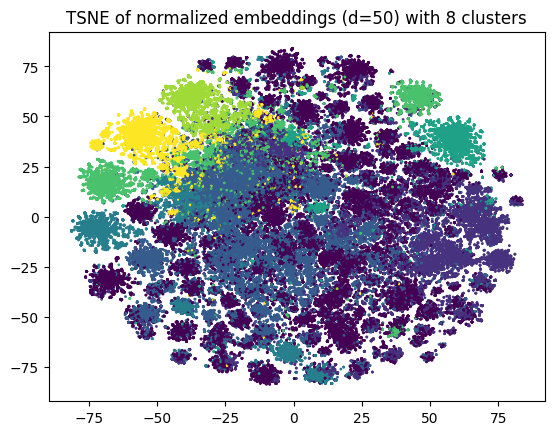

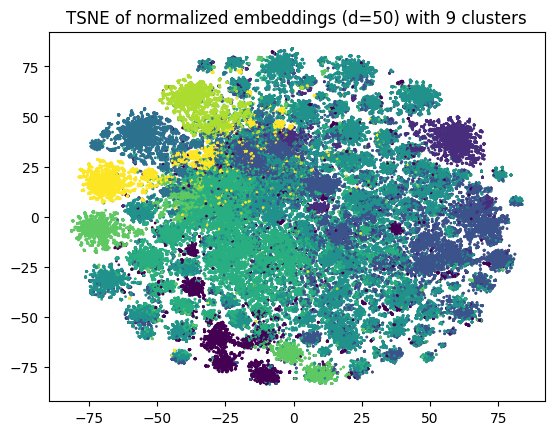

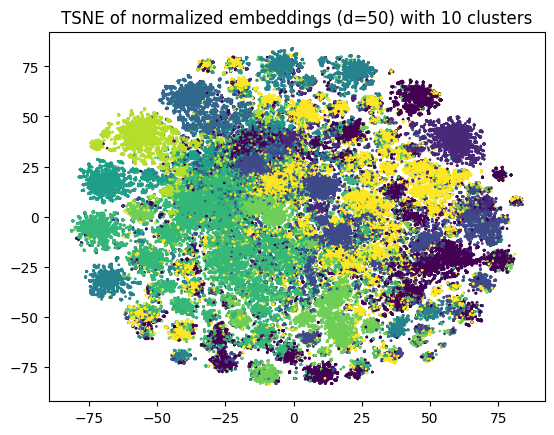

In [ ]:
for i in range(9):
    plt.scatter(tsne_embeddings_50[:, 0], tsne_embeddings_50[:, 1], c=clusters_array_50[i], s=1)
    plt.title(f'TSNE of normalized embeddings (d=50) with {i+2} clusters')
    plt.show()

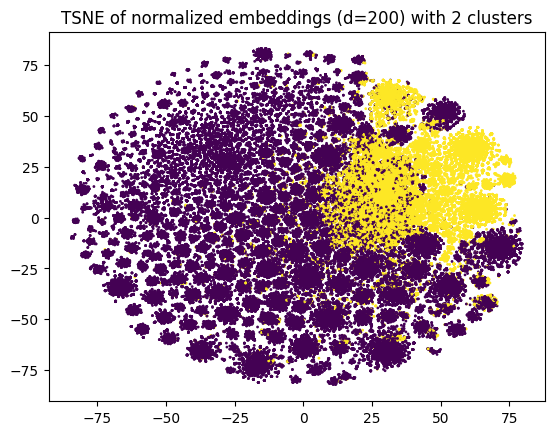

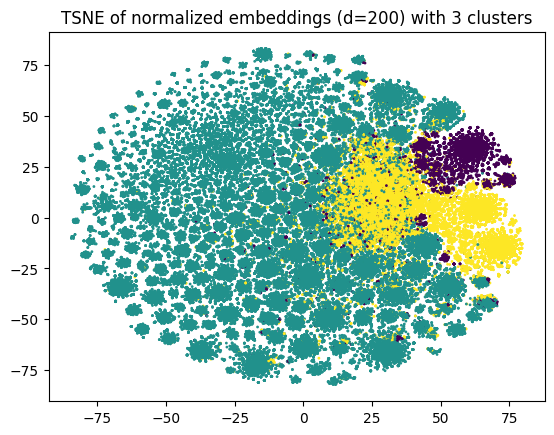

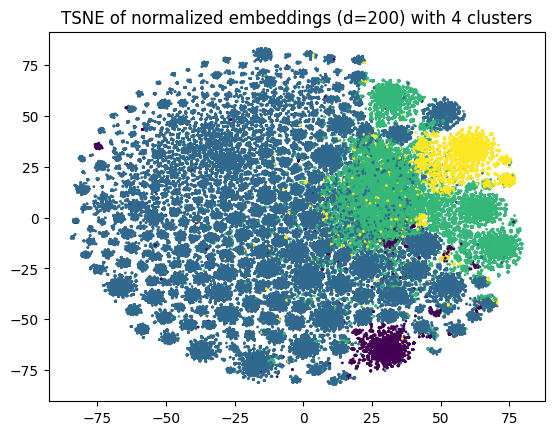

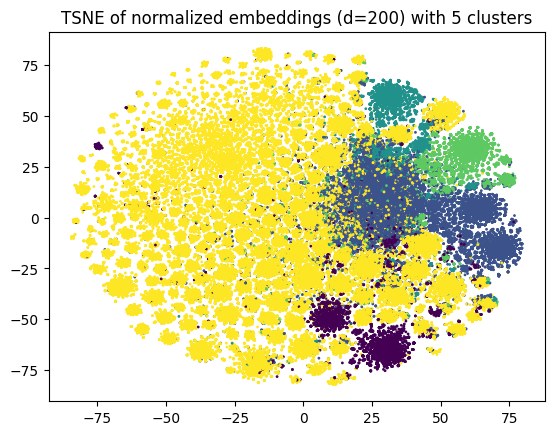

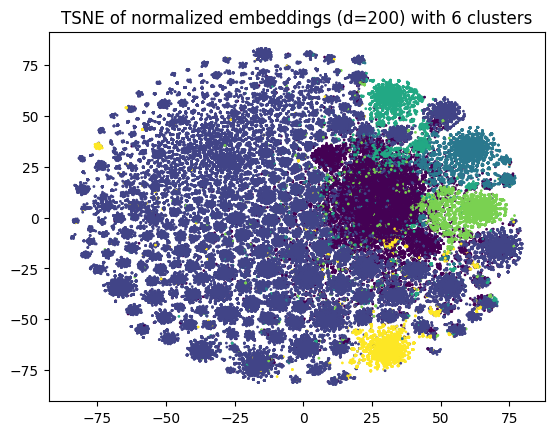

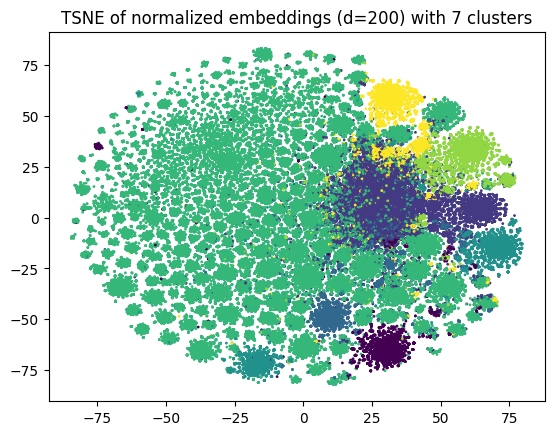

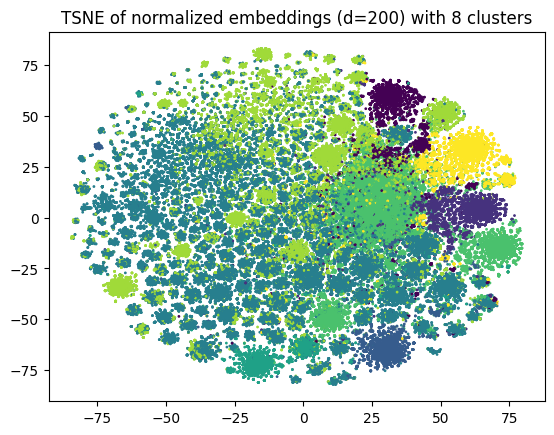

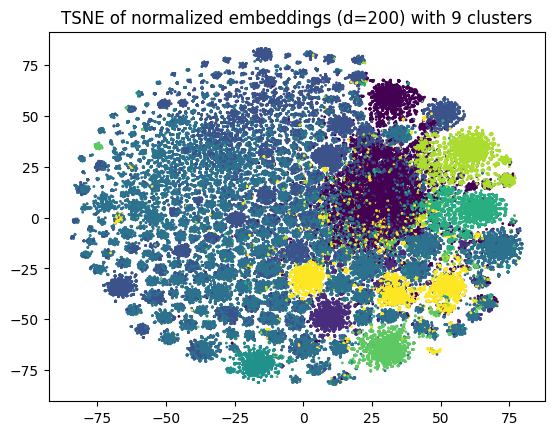

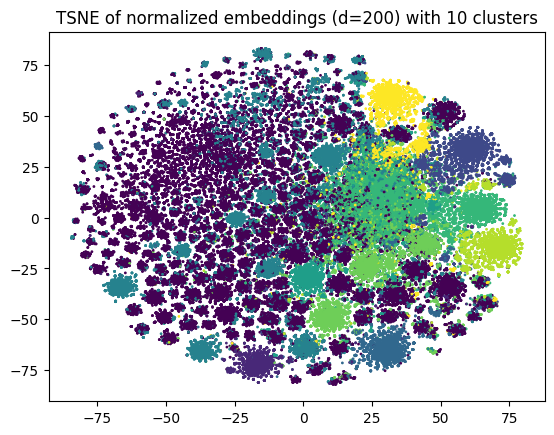

In [ ]:
for i in range(9):
    plt.scatter(tsne_embeddings_200[:, 0], tsne_embeddings_200[:, 1], c=clusters_array_200[i], s=1)
    plt.title(f'TSNE of normalized embeddings (d=200) with {i+2} clusters')
    plt.show()